In [49]:
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

from skimage.io import imread, imshow
import seaborn as sns
import cv2
from glob import glob
import pandas as pd
import json
import os
import numpy as np
import os
import torch
import numpy as np
import scanpy as sc
import squidpy as sq
import math
from PIL import Image

from ELD.utils import (toImg, preprocess, predict_landmarks, create_target_landmarks, 
                       create_target_images, download_images_urls, downscale_images, plot_images, 
                       mask_background, padImg, crop_non_tissue, downsize_and_save, 
                       rescale_landmarks, pad_image_and_adjust_landmarks, corr,plot_warped_images)
from ELD.model import loadFan, crop, toGrey
from ELD.warp import Homo, Rigid, TPS
import tifffile as tiff
from ELD.MTFAN import FAN, MultiModalFAN, convertLayer

In [50]:
path = 'D:/邮件/hippo/'

In [51]:
data_slice1=sc.read_h5ad(f'{path}data_slice1.h5ad')
data_slice2=sc.read_h5ad(f'{path}data_slice2.h5ad')

In [52]:
cluster1 = np.array(pd.read_csv('E:/庞大的学术帝国/图像对齐/data_hippo/cluster1.csv'))
cluster2 = np.array(pd.read_csv('E:/庞大的学术帝国/图像对齐/data_hippo/cluster2.csv'))

## slice1

In [53]:
#class_colors = plt.cm.rainbow(np.linspace(0, 1, 15))
class_colors = plt.cm.tab20(np.linspace(0, 1, 15))
point_colors = []
for i in cluster1[:,0]:
    point_colors.append(class_colors[i,:])

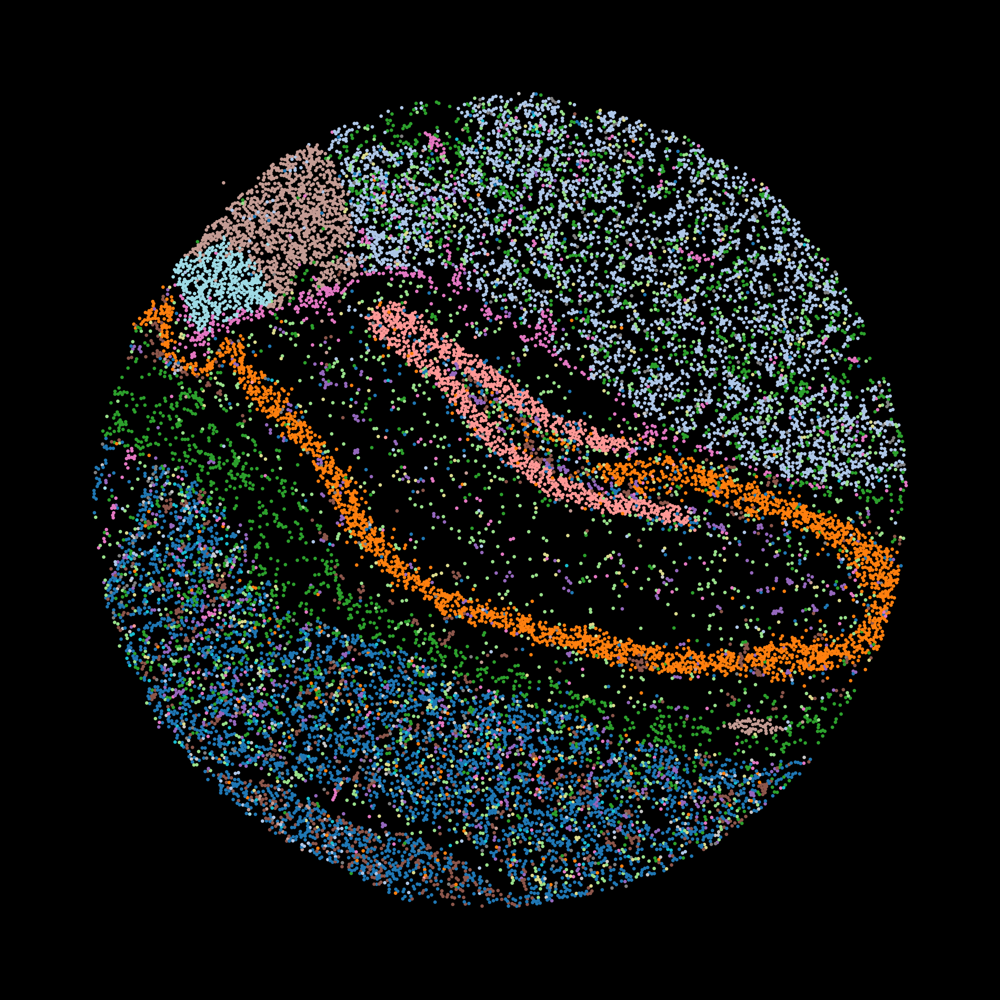

In [54]:
points = data_slice1.obsm['spatial']

x_min, x_max = min(points[:, 0]), max(points[:, 0])
y_min, y_max = min(points[:, 1]), max(points[:, 1])

x_margin = (x_max - x_min) * 0.1
y_margin = (y_max - y_min) * 0.1
x_min -= x_margin
x_max += x_margin
y_min -= y_margin
y_max += y_margin

width = x_max - x_min
height = y_max - y_min
aspect_ratio = height / width

fig_width = 10 
fig_height = fig_width * aspect_ratio

fig, ax = plt.subplots(figsize=(fig_width, fig_height), 
                       facecolor='black',
                       dpi=300) 

ax.set_xlim([x_min, x_max])
ax.set_ylim([y_min, y_max])

ax.set_facecolor('black')
fig.patch.set_facecolor('black')

scatter = ax.scatter(    points[:, 0], points[:, 1], c=point_colors, s=1)

#scatter = ax.scatter(points[:, 0], points[:, 1], c=n, s=1,linewidths=0.8 )

ax.axis('off')

plt.savefig(
    f'{path}slice1.png',
    dpi=300,
    bbox_inches='tight',
    pad_inches=0, 
    transparent=False, 
    facecolor='black'
)
plt.show()

In [55]:
image_1 = cv2.cvtColor(cv2.imdecode(np.fromfile(f'{path}slice1.png', dtype=np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

In [56]:
image_1.shape

(2325, 2325, 3)

In [57]:
x_min1 = min(points[:, 0])
y_min1 = min(points[:, 1])
pixel_x1 = ((points[:,0] - x_min1 + x_margin) / (x_max - x_min) ) * (2325 - 1)
pixel_y1 = ((points[:,1] - y_min1 + y_margin) / (y_max - y_min) ) * (2325 - 1)

In [58]:
image_1 = np.flip(image_1,axis = 0)

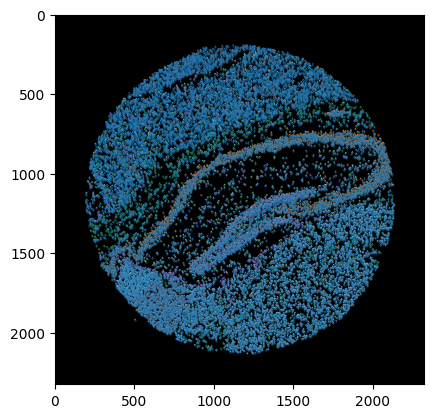

In [59]:
plt.imshow(image_1)
plt.scatter(pixel_x1,pixel_y1,s=0.1)


In [60]:
grayscale = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
thresholded = cv2.threshold(grayscale, 0, 255, cv2.THRESH_OTSU)
bbox = cv2.boundingRect(thresholded[1])
bbox

(190, 190, 1945, 1946)

In [61]:
pixel_x1 = pixel_x1-190
pixel_y1 = pixel_y1-190

## slice2

In [62]:
#class_colors = plt.cm.rainbow(np.linspace(0, 1, 15))
class_colors = plt.cm.tab20(np.linspace(0, 1, 15))
point_colors = []
for i in cluster2[:,0]:
    point_colors.append(class_colors[i,:])

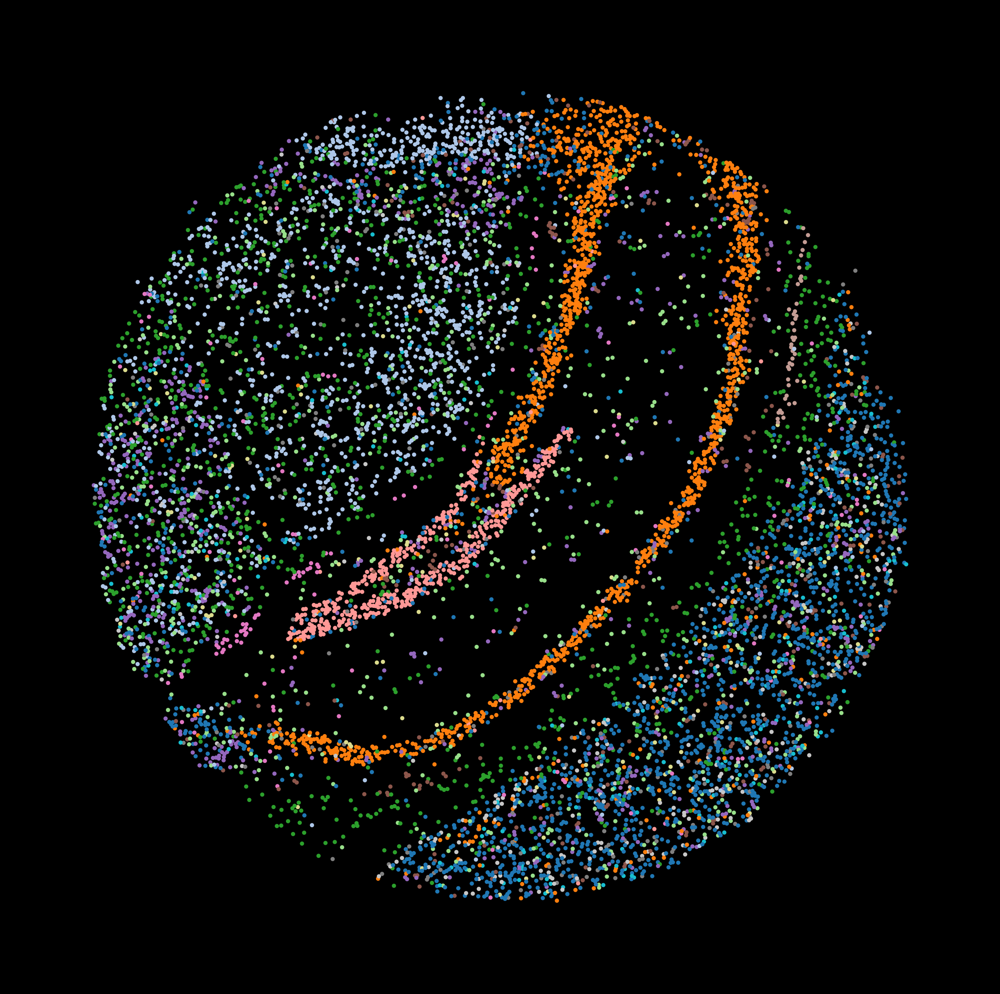

In [63]:
points = data_slice2.obsm['spatial']

x_min, x_max = min(points[:, 0]), max(points[:, 0])
y_min, y_max = min(points[:, 1]), max(points[:, 1])

x_margin = (x_max - x_min) * 0.1
y_margin = (y_max - y_min) * 0.1
x_min -= x_margin
x_max += x_margin
y_min -= y_margin
y_max += y_margin

width = x_max - x_min
height = y_max - y_min
aspect_ratio = height / width

fig_width = 10 
fig_height = fig_width * aspect_ratio

fig, ax = plt.subplots(figsize=(fig_width, fig_height), 
                       facecolor='black',
                       dpi=300) 

ax.set_xlim([x_min, x_max])
ax.set_ylim([y_min, y_max])

ax.set_facecolor('black')
fig.patch.set_facecolor('black')

scatter = ax.scatter(points[:, 0], points[:, 1],c=point_colors,s=2)
#scatter = ax.scatter(points[:, 0], points[:, 1],c=n,s=1)
ax.axis('off')

plt.savefig(
    f'{path}slice2.png', 
    dpi=300,  
    bbox_inches='tight', 
    pad_inches=0,
    transparent=False, 
    facecolor='black' 
)
plt.show()

In [64]:
image_2 = cv2.cvtColor(cv2.imdecode(np.fromfile(f'{path}slice2.png', dtype=np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

In [65]:
image_2.shape

(2311, 2325, 3)

In [66]:
x_min2 = min(points[:, 0])
y_min2 = min(points[:, 1])

pixel_x2 = ((points[:,0] - x_min2 + x_margin) / (x_max - x_min) ) * (2325 - 1)
pixel_y2 = ((points[:,1] - y_min2 + y_margin) / (y_max - y_min) ) * (2311 - 1)

In [67]:
image_2 = np.flip(image_2,axis = 0)

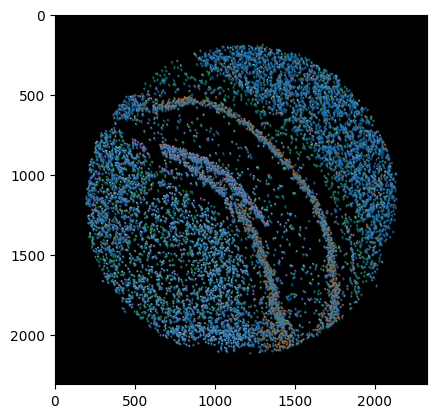

In [68]:
plt.imshow(image_2)
plt.scatter(pixel_x2,pixel_y2,s=0.1)

In [69]:
grayscale = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)
thresholded = cv2.threshold(grayscale, 0, 255, cv2.THRESH_OTSU)
bbox = cv2.boundingRect(thresholded[1])
bbox

(189, 188, 1947, 1936)

In [70]:
pixel_x2 = pixel_x2-189
pixel_y2 = pixel_y2-188

# slice_3

In [71]:
data_slice3=sc.read_h5ad(f'{path}data_slice3.h5ad')
image_3 = tiff.imread(f'{path}V1_Adult_Mouse_Brain_image.tif')


In [72]:
image_3.shape

(11757, 11291, 3)

In [73]:
mask = np.zeros_like(image_3)
x = 4510
y = 3830
r = 2100
cv2.circle(mask, (x, y), r, (255, 255, 255), -1)

image_3 = np.where(mask == 255, image_3, 0)

In [74]:
grayscale = cv2.cvtColor(image_3, cv2.COLOR_BGR2GRAY)
thresholded = cv2.threshold(grayscale, 0, 255, cv2.THRESH_OTSU)
bbox = cv2.boundingRect(thresholded[1])
bbox

(2410, 1730, 4201, 4201)

In [75]:
pixel_x3 = data_slice3.obsm['spatial'][:,0] - 2410
pixel_y3 = data_slice3.obsm['spatial'][:,1] - 1730

In [76]:
imageList = [image_1,image_2,image_3]

In [77]:
imageList = crop_non_tissue(imageList)

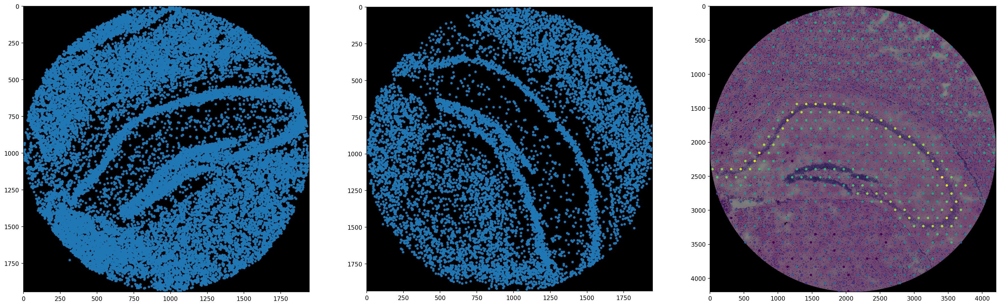

In [78]:
plt.figure(dpi=150,figsize=(40,10))
plt.subplot(1,4, 1)
plt.imshow(imageList[0])
plt.scatter(pixel_x1,pixel_y1,s=10)

plt.subplot(1,4, 2)
plt.imshow(imageList[1])
plt.scatter(pixel_x2,pixel_y2,s=10)

plt.subplot(1,4, 3)
plt.imshow(imageList[2])
plt.scatter(pixel_x3,pixel_y3,s=10,c=data_slice3.X[:,np.where(data_slice3.var_names=='Hpca')[0][0]])

In [79]:
imageList[0].shape

(1946, 1945, 3)

In [80]:
for i in [1,2,3]:
    scalex = 128/imageList[i-1].shape[1]
    scaley = 128/imageList[i-1].shape[0]
    globals()[f"pixel_x{i}"]=globals()[f"pixel_x{i}"]*scalex
    globals()[f"pixel_y{i}"]=globals()[f"pixel_y{i}"]*scaley

In [81]:
small_imgs = downsize_and_save(imageList, path)

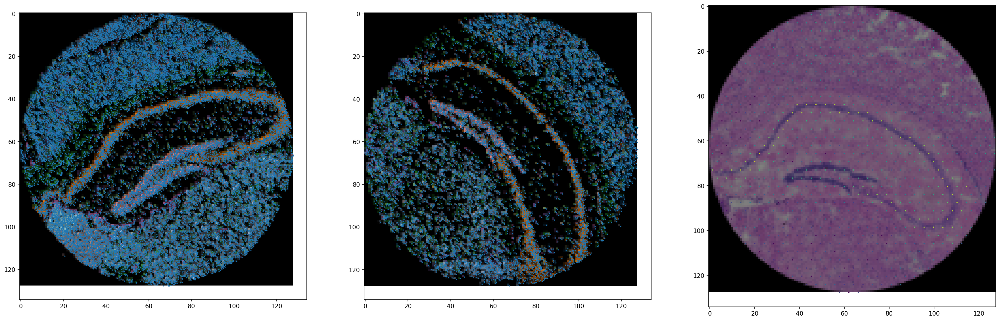

In [82]:
plt.figure(dpi=150,figsize=(40,10))
plt.subplot(1,4, 1)
plt.imshow(small_imgs[0])
plt.scatter(pixel_x1,pixel_y1,s=1)

plt.subplot(1,4, 2)
plt.imshow(small_imgs[1])
plt.scatter(pixel_x2,pixel_y2,s=1)

plt.subplot(1,4, 3)
plt.imshow(small_imgs[2])
plt.scatter(pixel_x3,pixel_y3,s=1,c=data_slice3.X[:,np.where(data_slice3.var_names=='Hpca')[0][0]])

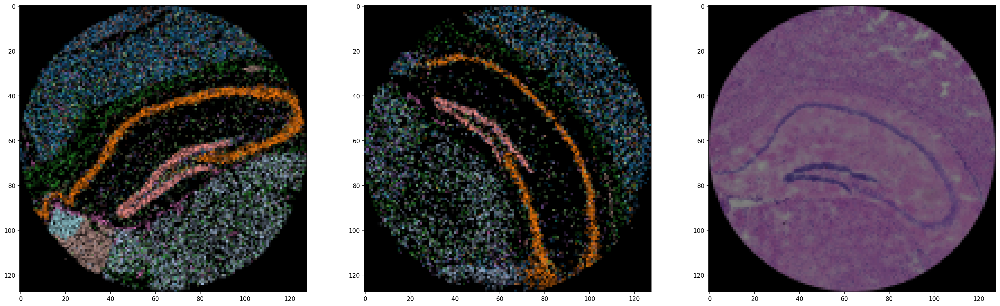

In [83]:
plt.figure(dpi=150,figsize=(40,10))
plt.subplot(1,4, 1)
plt.imshow(small_imgs[0])

plt.subplot(1,4, 2)
plt.imshow(small_imgs[1])

plt.subplot(1,4, 3)
plt.imshow(small_imgs[2])

eld-train --elastic_sigma 3.5 --cuda 1 --port 9007 --data_path "/share/home/yinjun/SRT/ELD-main/hippo_flip/" --npts 15 --o scratch  --ws 10000 --angle 10 --model 3d

# after train

In [84]:
spatial_reference=np.zeros(data_slice3.obsm['spatial'].shape)
maxx=np.max(pixel_x3)
minx=np.min(pixel_x3)
maxy=np.max(pixel_y3)
miny=np.min(pixel_y3)

x=(pixel_x3-minx)/(maxx-minx)
y=(pixel_y3-miny)/(maxy-miny)
spatial_reference[:,0]=x
spatial_reference[:,1]=y

In [85]:
image = torch.stack([preprocess(img) for img in small_imgs])

In [86]:
net = FAN(1,in_channels=3, n_points=15).to('cpu')
checkpoint = torch.load('model_31.fan.pth', map_location=torch.device('cpu'))
checkpoint = {k.replace('module.',''): v for k,v in checkpoint.items()}
net.load_state_dict(checkpoint)
fan = net.to('cpu')

In [87]:
def predict_landmarks(fan, image):
    with torch.no_grad():
        #img = sample['Im']
        
        fan.eval()

        with torch.no_grad():
            pts = 4 * spatial_soft_argmax2d(fan(image.cpu()), False)
    return pts
        

In [88]:
pts_15 = predict_landmarks(fan, image)

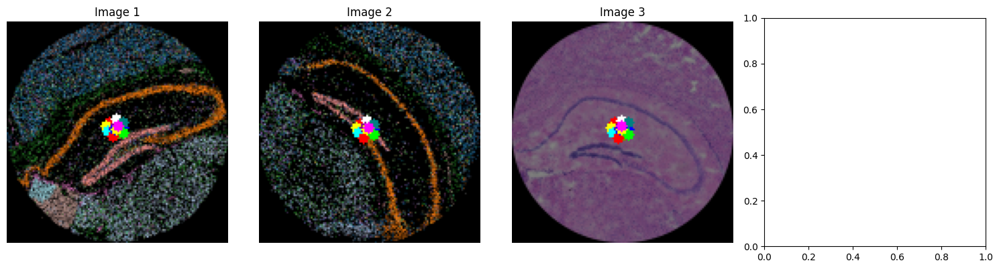

In [89]:
#combine landmarks and image
np_img = toImg(image.cpu()[:,:3], pts_15, 128)


fig, axs = plt.subplots(1, 4, figsize=(15, 4))  # adjust the size as needed
axs = axs.ravel()

for i in range(len(np_img)):
    img = np_img[i]
    axs[i].imshow(img)
    axs[i].set_title(f"Image {i+1}")
    axs[i].axis('off')  # to hide the axis

plt.tight_layout()
plt.show()

In [90]:
x=(pts_15[2].detach().numpy()[:,0]-minx)/(maxx-minx)
y=(pts_15[2].detach().numpy()[:,1]-miny)/(maxy-miny)

lm_reference_15 = np.column_stack((x, y))

for i in range(1,3):
    x=pts_15[i-1].detach().numpy()[:,0]
    y=pts_15[i-1].detach().numpy()[:,1]
    globals()[f"lm_{i}_15"]= np.column_stack((x, y))

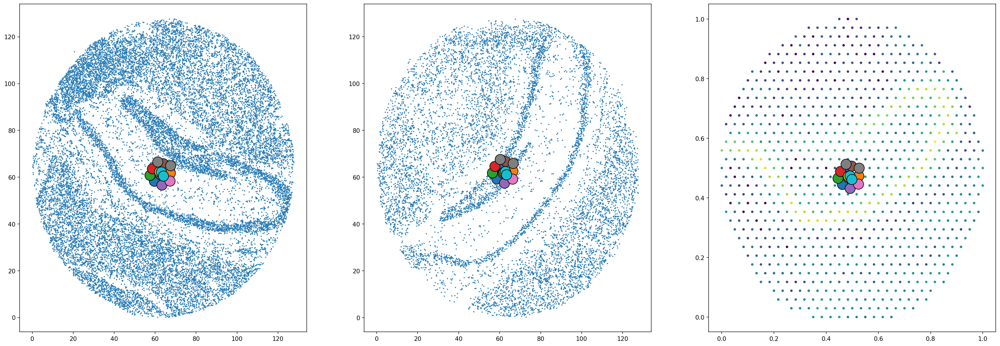

In [91]:
color = plt.cm.tab10(np.linspace(0, 1, 15))

plt.figure(dpi=150,figsize=(40,10))
plt.subplot(1,4, 1)
plt.scatter(pixel_x1,pixel_y1,s=1)
plt.scatter(lm_1_15[:,0],lm_1_15[:,1],s=300, color = color,edgecolor='black',linewidth=1)

plt.subplot(1,4, 2)
plt.scatter(pixel_x2,pixel_y2,s=1)
plt.scatter(lm_2_15[:,0],lm_2_15[:,1],s=300, color = color,edgecolor='black',linewidth=1)

plt.subplot(1,4, 3)
plt.scatter(spatial_reference[:,0],spatial_reference[:,1],s=10,c=data_slice3.X[:,np.where(data_slice3.var_names=='Hpca')[0][0]])
plt.scatter(lm_reference_15[:,0],lm_reference_15[:,1],s=300, color = color,edgecolor='black',linewidth=1)

In [92]:
for i in range(1,3) :
    lm1 = lm_reference_15.copy()
    lm2 = globals()[f"lm_{i}_15"].copy()
    one=np.ones(lm2.shape[0])
    lm2=np.insert(lm2,2,one,axis=1)
    M1=np.dot(np.dot(np.linalg.inv(np.dot(lm2.T,lm2)),lm2.T),lm1)
    lm2_tran=np.dot(lm2,M1)
    cor1=np.c_[globals()[f"pixel_x{i}"],globals()[f"pixel_y{i}"],np.ones(globals()[f"pixel_x{i}"].shape[0])]
    globals()[f"spatial_{i}_15"]=np.dot(cor1,M1)
    globals()[f"lm_{i}_15"] = lm2_tran


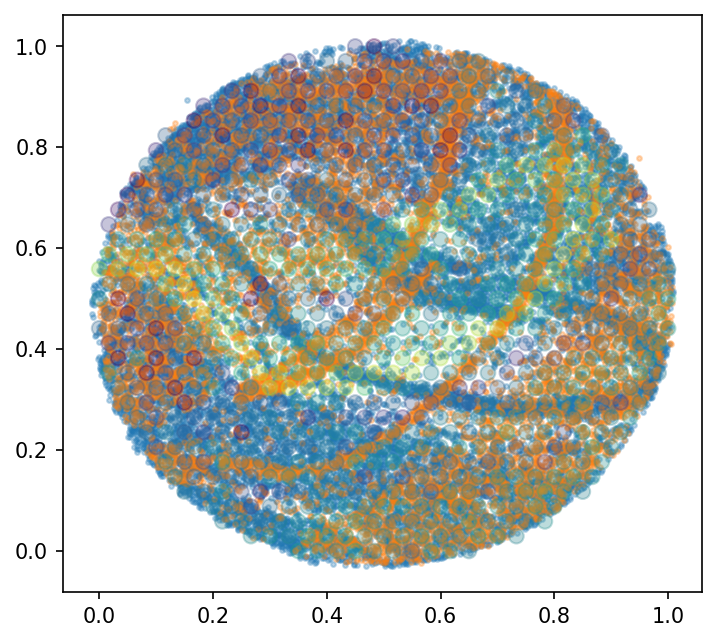

In [93]:
plt.figure(dpi=150,figsize=(5.5, 5) )
for i in range(1,3):
    plt.scatter(globals()[f'spatial_{i}_15'][:,0],globals()[f'spatial_{i}_15'][:,1],alpha=0.3,s=5)

plt.scatter(spatial_reference[:,0],spatial_reference[:,1],c=data_slice3.X[:,np.where(data_slice3.var_names=='Hpca')[0][0]],alpha=0.3,s=50)
#plt.axis("off")